In [1]:
import sys

!{sys.executable} -m pip install numpy
!{sys.executable} -m pip install pandas
!{sys.executable} -m pip install matplotlib
!{sys.executable} -m pip install scipy
!{sys.executable} -m pip install scikit-learn
!{sys.executable} -m pip install statsmodels
!{sys.executable} -m pip install seaborn

In [3]:
# Importing global libraries

import numpy as np  # we will use it for linear algebra
import pandas as pd # we will use it data processing (our data is in CSV file so we read from pd.read_csv)

import io
import requests

# we will use plotty and seaborn for data exploration and data/model visualisation
from plotly.offline import iplot
import plotly.graph_objs as go
from plotly import tools
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import plotly.express as px
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')

from datetime import tzinfo, timedelta, datetime, date

In [4]:
fileP = "Data/IrelandweatherElectricity2017_2022.csv" 
dataset = pd.read_csv(fileP, parse_dates=[1], na_values=" ")

In [5]:
print('----------- Looking for understanding the size of the data -------------')
print(dataset.shape)           # 68 Columns, 46032 rows

# Splitting this into two variables for better readibility
count_row = dataset.shape[0]   # 68 Columns
count_col = dataset.shape[1]   # 46032 rows
print('Rows: ', count_row, ', Columns: ', count_col)

----------- Looking for understanding the size of the data -------------
(46032, 71)
Rows:  46032 , Columns:  71


In [6]:
print('-----------Listing all the columns that we have in data/dictionary-------------')
# casting them to the list for better readibility (and work on the model later)
columns = dataset.columns.values.tolist() 
print (columns)

-----------Listing all the columns that we have in data/dictionary-------------
['Unnamed: 0', 'date', 'Year', 'Month', 'Hour', 'rain_BEL', 'temp_BEL', 'wetb_BEL', 'dewpt_BEL', 'vappr_BEL', 'rhum_BEL', 'msl_BEL', 'wdsp_BEL', 'wddir_BEL', 'rain_DUB', 'temp_DUB', 'wetb_DUB', 'dewpt_DUB', 'vappr_DUB', 'rhum_DUB', 'msl_DUB', 'wdsp_DUB', 'wddir_DUB', 'ww_DUB', 'w_DUB', 'sun_DUB', 'vis_DUB', 'clht_DUB', 'clamt_DUB', 'rain', 'temp', 'wetb', 'dewpt', 'vappr', 'rhum', 'msl', 'wdsp', 'wddir', 'ww', 'w', 'sun', 'vis', 'clht', 'clamt', 'rain_COR', 'temp_COR', 'wetb_COR', 'dewpt_COR', 'vappr_COR', 'rhum_COR', 'msl_COR', 'wdsp_COR', 'wddir_COR', 'ww_COR', 'w_COR', 'sun_COR', 'vis_COR', 'clht_COR', 'clamt_COR', 'rain_MAL', 'temp_MAL', 'wetb_MAL', 'dewpt_MAL', 'vappr_MAL', 'rhum_MAL', 'msl_MAL', 'wdsp_MAL', 'wddir_MAL', 'ActualDemandMW', 'ActualWindMW', 'ActualGenerationMW']


In [7]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46032 entries, 0 to 46031
Data columns (total 71 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Unnamed: 0          46032 non-null  int64         
 1   date                46032 non-null  datetime64[ns]
 2   Year                46032 non-null  int64         
 3   Month               46032 non-null  object        
 4   Hour                46032 non-null  object        
 5   rain_BEL            46032 non-null  float64       
 6   temp_BEL            46032 non-null  float64       
 7   wetb_BEL            46032 non-null  float64       
 8   dewpt_BEL           46032 non-null  float64       
 9   vappr_BEL           46032 non-null  float64       
 10  rhum_BEL            46032 non-null  int64         
 11  msl_BEL             46032 non-null  float64       
 12  wdsp_BEL            46032 non-null  int64         
 13  wddir_BEL           46032 non-null  int64     

In [8]:
dataset.describe()

,Unnamed: 0,Year,rain_BEL,temp_BEL,wetb_BEL,dewpt_BEL,vappr_BEL,rhum_BEL,msl_BEL,wdsp_BEL,...,wetb_MAL,dewpt_MAL,vappr_MAL,rhum_MAL,msl_MAL,wdsp_MAL,wddir_MAL,ActualDemandMW,ActualWindMW,ActualGenerationMW
count,46032.000000,46032.000000,46032.000000,46032.000000,46032.000000,46032.000000,46032.000000,46032.000000,46032.000000,46032.000000,...,46032.000000,46032.000000,46032.000000,46032.000000,46032.000000,46032.000000,46032.000000,45995.000000,45995.000000,45995.000000
mean,23015.500000,2019.616267,0.151807,10.723614,9.304734,7.720831,10.915174,82.009798,1012.376195,11.899635,...,8.898332,7.266869,10.585925,81.467436,1011.832921,14.749109,202.748957,3376.643191,1078.091160,3360.779436
std,13288.438132,1.557998,0.503334,4.001554,3.808060,4.268925,3.085598,11.174165,13.090315,6.598940,...,3.780481,4.268392,3.023919,9.869051,13.172766,7.267588,86.520278,621.925684,812.194475,597.206859
min,0.000000,2017.000000,0.000000,-3.300000,-4.400000,-9.700000,2.900000,24.000000,959.100000,0.000000,...,-3.000000,-7.900000,3.400000,20.000000,956.600000,1.000000,0.000000,1934.500000,-44.000000,1506.000000
25%,11507.750000,2018.000000,0.000000,7.900000,6.500000,4.600000,8.500000,74.000000,1004.000000,7.000000,...,6.000000,4.000000,8.100000,75.000000,1003.200000,9.000000,150.000000,2864.750000,359.750000,2952.250000
50%,23015.500000,2020.000000,0.000000,10.800000,9.500000,8.000000,10.700000,84.000000,1014.000000,11.000000,...,9.000000,7.400000,10.300000,83.000000,1013.500000,14.000000,210.000000,3433.500000,909.000000,3306.000000
75%,34523.250000,2021.000000,0.000000,13.700000,12.200000,10.900000,13.000000,91.000000,1021.600000,16.000000,...,11.900000,10.500000,12.700000,89.000000,1021.000000,19.000000,270.000000,3849.500000,1705.250000,3728.750000
max,46031.000000,2022.000000,14.900000,28.000000,22.100000,19.400000,22.500000,100.000000,1050.600000,45.000000,...,19.800000,18.700000,21.500000,100.000000,1051.200000,48.000000,360.000000,5335.750000,3570.000000,5955.500000


In [9]:
dataset.drop("Unnamed: 0", axis=1, inplace=True)

In [10]:
dataset.describe()

,Year,rain_BEL,temp_BEL,wetb_BEL,dewpt_BEL,vappr_BEL,rhum_BEL,msl_BEL,wdsp_BEL,wddir_BEL,...,wetb_MAL,dewpt_MAL,vappr_MAL,rhum_MAL,msl_MAL,wdsp_MAL,wddir_MAL,ActualDemandMW,ActualWindMW,ActualGenerationMW
count,46032.000000,46032.000000,46032.000000,46032.000000,46032.000000,46032.000000,46032.000000,46032.000000,46032.000000,46032.000000,...,46032.000000,46032.000000,46032.000000,46032.000000,46032.000000,46032.000000,46032.000000,45995.000000,45995.000000,45995.000000
mean,2019.616267,0.151807,10.723614,9.304734,7.720831,10.915174,82.009798,1012.376195,11.899635,201.557829,...,8.898332,7.266869,10.585925,81.467436,1011.832921,14.749109,202.748957,3376.643191,1078.091160,3360.779436
std,1.557998,0.503334,4.001554,3.808060,4.268925,3.085598,11.174165,13.090315,6.598940,93.289032,...,3.780481,4.268392,3.023919,9.869051,13.172766,7.267588,86.520278,621.925684,812.194475,597.206859
min,2017.000000,0.000000,-3.300000,-4.400000,-9.700000,2.900000,24.000000,959.100000,0.000000,10.000000,...,-3.000000,-7.900000,3.400000,20.000000,956.600000,1.000000,0.000000,1934.500000,-44.000000,1506.000000
25%,2018.000000,0.000000,7.900000,6.500000,4.600000,8.500000,74.000000,1004.000000,7.000000,150.000000,...,6.000000,4.000000,8.100000,75.000000,1003.200000,9.000000,150.000000,2864.750000,359.750000,2952.250000
50%,2020.000000,0.000000,10.800000,9.500000,8.000000,10.700000,84.000000,1014.000000,11.000000,220.000000,...,9.000000,7.400000,10.300000,83.000000,1013.500000,14.000000,210.000000,3433.500000,909.000000,3306.000000
75%,2021.000000,0.000000,13.700000,12.200000,10.900000,13.000000,91.000000,1021.600000,16.000000,270.000000,...,11.900000,10.500000,12.700000,89.000000,1021.000000,19.000000,270.000000,3849.500000,1705.250000,3728.750000
max,2022.000000,14.900000,28.000000,22.100000,19.400000,22.500000,100.000000,1050.600000,45.000000,360.000000,...,19.800000,18.700000,21.500000,100.000000,1051.200000,48.000000,360.000000,5335.750000,3570.000000,5955.500000


In [11]:
dataset.isnull().sum()[0:50]

date         0
Year         0
Month        0
Hour         0
rain_BEL     0
temp_BEL     0
wetb_BEL     0
dewpt_BEL    0
vappr_BEL    0
rhum_BEL     0
msl_BEL      0
wdsp_BEL     0
wddir_BEL    0
rain_DUB     0
temp_DUB     0
wetb_DUB     0
dewpt_DUB    0
vappr_DUB    0
rhum_DUB     0
msl_DUB      0
wdsp_DUB     0
wddir_DUB    0
ww_DUB       0
w_DUB        0
sun_DUB      0
vis_DUB      0
clht_DUB     0
clamt_DUB    0
rain         0
temp         0
wetb         0
dewpt        0
vappr        0
rhum         0
msl          0
wdsp         0
wddir        0
ww           0
w            0
sun          0
vis          0
clht         0
clamt        0
rain_COR     0
temp_COR     0
wetb_COR     0
dewpt_COR    0
vappr_COR    0
rhum_COR     0
msl_COR      0
dtype: int64

In [12]:
dataset.isnull().sum()[50:67]

wdsp_COR     0
wddir_COR    0
ww_COR       0
w_COR        0
sun_COR      0
vis_COR      0
clht_COR     0
clamt_COR    0
rain_MAL     0
temp_MAL     0
wetb_MAL     0
dewpt_MAL    0
vappr_MAL    0
rhum_MAL     0
msl_MAL      0
wdsp_MAL     0
wddir_MAL    0
dtype: int64

In [13]:
print("number of NaN values for the column ActualDemandMW :", dataset['ActualDemandMW'].isnull().sum())
print("number of NaN values for the column ActualWindMW :", dataset['ActualWindMW'].isnull().sum())
print("number of NaN values for the column ActualGenerationMW :", dataset['ActualGenerationMW'].isnull().sum())

number of NaN values for the column ActualDemandMW : 37
number of NaN values for the column ActualWindMW : 37
number of NaN values for the column ActualGenerationMW : 37


In [14]:
mean=dataset['ActualDemandMW'].mean()
dataset['ActualDemandMW'].replace(np.nan,mean, inplace=True)

In [15]:
mean=dataset['ActualWindMW'].mean()
dataset['ActualWindMW'].replace(np.nan,mean, inplace=True)

In [16]:
mean=dataset['ActualGenerationMW'].mean()
dataset['ActualGenerationMW'].replace(np.nan,mean, inplace=True)

In [17]:
print("number of NaN values for the column ActualDemandMW :", dataset['ActualDemandMW'].isnull().sum())
print("number of NaN values for the column ActualWindMW :", dataset['ActualWindMW'].isnull().sum())
print("number of NaN values for the column ActualGenerationMW :", dataset['ActualGenerationMW'].isnull().sum())

number of NaN values for the column ActualDemandMW : 0
number of NaN values for the column ActualWindMW : 0
number of NaN values for the column ActualGenerationMW : 0


In [18]:
dataset['RatioWindDemand'] = dataset['ActualWindMW'] / dataset['ActualDemandMW']

In [19]:
dataset.loc[dataset['RatioWindDemand'] >= 0.7, 'ExcessWind'] = 1 
dataset.loc[dataset['RatioWindDemand'] < 0.7, 'ExcessWind'] = 0 

dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46032 entries, 0 to 46031
Data columns (total 72 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   date                46032 non-null  datetime64[ns]
 1   Year                46032 non-null  int64         
 2   Month               46032 non-null  object        
 3   Hour                46032 non-null  object        
 4   rain_BEL            46032 non-null  float64       
 5   temp_BEL            46032 non-null  float64       
 6   wetb_BEL            46032 non-null  float64       
 7   dewpt_BEL           46032 non-null  float64       
 8   vappr_BEL           46032 non-null  float64       
 9   rhum_BEL            46032 non-null  int64         
 10  msl_BEL             46032 non-null  float64       
 11  wdsp_BEL            46032 non-null  int64         
 12  wddir_BEL           46032 non-null  int64         
 13  rain_DUB            46032 non-null  float64   

In [19]:
dataset.to_csv("Data/ExcessWind.csv")

In [20]:
dataset

,date,Year,Month,Hour,rain_BEL,temp_BEL,wetb_BEL,dewpt_BEL,vappr_BEL,rhum_BEL,...,vappr_MAL,rhum_MAL,msl_MAL,wdsp_MAL,wddir_MAL,ActualDemandMW,ActualWindMW,ActualGenerationMW,RatioWindDemand,ExcessWind
0,2017-07-01 00:00:00,2017,Jul,0:00,0.0,12.3,11.3,10.3,12.5,88,...,10.2,84,1016.8,10,270,2534.00,330.00,2709.00,0.130229,0.0
1,2017-07-01 01:00:00,2017,Jul,1:00,0.0,12.5,11.4,10.4,12.6,87,...,10.3,84,1016.2,10,260,2336.75,353.50,2689.75,0.151278,0.0
2,2017-07-01 02:00:00,2017,Jul,2:00,0.0,13.0,11.9,10.9,13.0,86,...,10.9,88,1015.8,10,220,2187.50,383.75,2680.75,0.175429,0.0
3,2017-07-01 03:00:00,2017,Jul,3:00,0.0,12.9,12.0,11.2,13.3,89,...,10.1,89,1015.4,10,190,2138.25,440.50,2762.50,0.206010,0.0
4,2017-07-01 04:00:00,2017,Jul,4:00,0.0,13.3,12.7,12.2,14.2,93,...,10.0,89,1015.2,10,190,2098.00,438.75,2550.75,0.209128,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46027,2022-09-30 19:00:00,2022,Sep,19:00,0.0,13.6,11.8,10.1,12.4,79,...,12.1,86,990.4,21,240,4033.50,2560.00,4419.75,0.634685,0.0
46028,2022-09-30 20:00:00,2022,Sep,20:00,0.8,13.3,11.3,9.3,11.7,77,...,12.3,81,990.6,20,240,3943.75,2591.75,4168.25,0.657179,0.0
46029,2022-09-30 21:00:00,2022,Sep,21:00,0.0,13.4,10.9,8.6,11.1,72,...,11.9,78,990.9,22,260,3682.00,2518.75,3973.00,0.684071,0.0
46030,2022-09-30 22:00:00,2022,Sep,22:00,0.0,13.2,11.0,8.8,11.3,74,...,11.7,78,991.6,23,260,3389.50,2339.50,3418.00,0.690220,0.0


In [24]:
dataset.set_index('date', inplace=True)

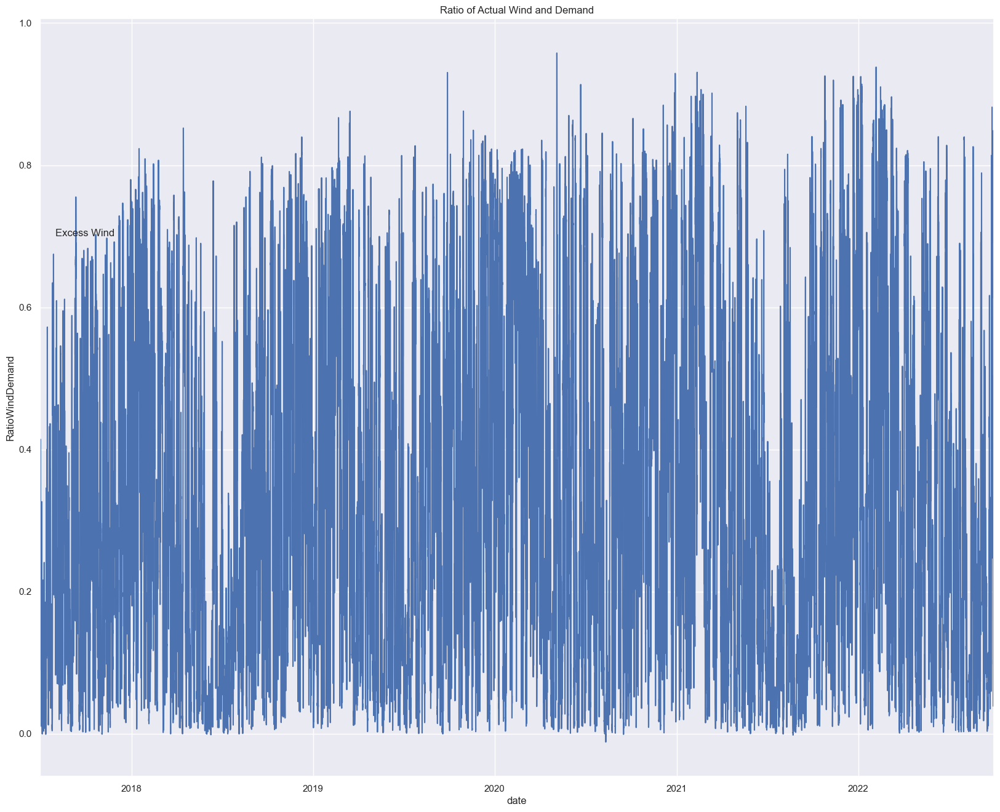

In [25]:
%matplotlib inline 

import matplotlib as mpl
import matplotlib.pyplot as plt

dataset['RatioWindDemand'].plot(kind='line')

plt.title('Ratio of Actual Wind and Demand')
plt.ylabel('RatioWindDemand')
plt.xlabel('date')

plt.text('2017-08-01', 0.7, 'Excess Wind') # see note below


plt.show() # need this line to show the updates made to the figure

-----------Checking wind speed by ExcessWind -------------


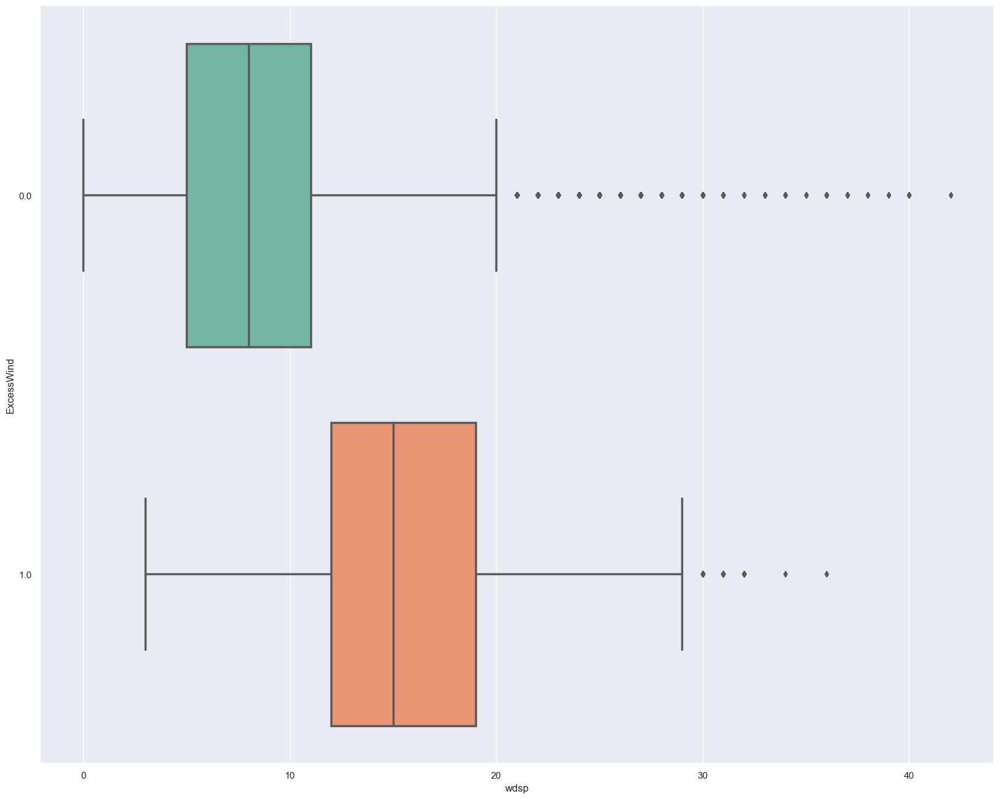

In [22]:
print('-----------Checking wind speed by ExcessWind -------------')
#using seaborn to Check wind speed by Month of each Year
sns.set_theme(style="whitegrid")

ExcessWind = dataset.groupby(['ExcessWind']).groups.keys()
windspeed = dataset['wdsp']

sns.set(rc={'figure.figsize':(20.0,16.00)})
ax = sns.boxplot(x=windspeed, y=dataset['ExcessWind'], data=dataset, linewidth=2.5, orient="h", palette="Set2")


<AxesSubplot: xlabel='wdsp', ylabel='ActualGenerationMW'>

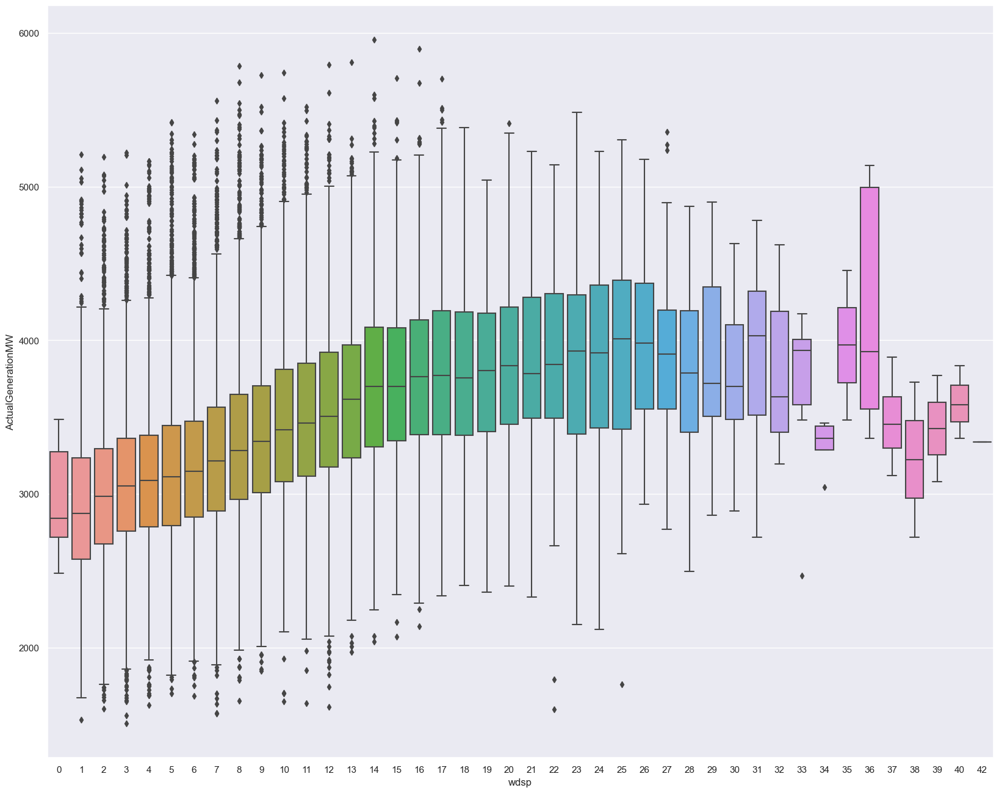

In [24]:
sns.boxplot(x="wdsp", y="ActualGenerationMW", data=dataset)

<AxesSubplot: xlabel='wdsp', ylabel='ActualWindMW'>

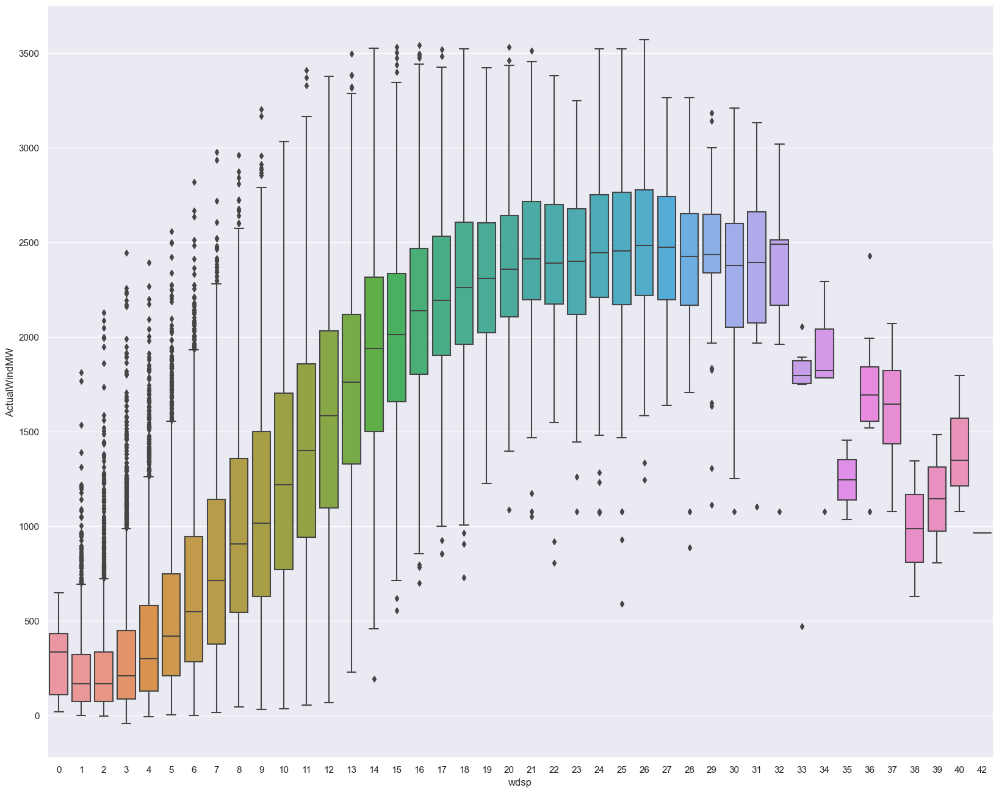

In [25]:
sns.boxplot(x="wdsp", y="ActualWindMW", data=dataset)

<AxesSubplot: xlabel='wdsp', ylabel='ActualDemandMW'>

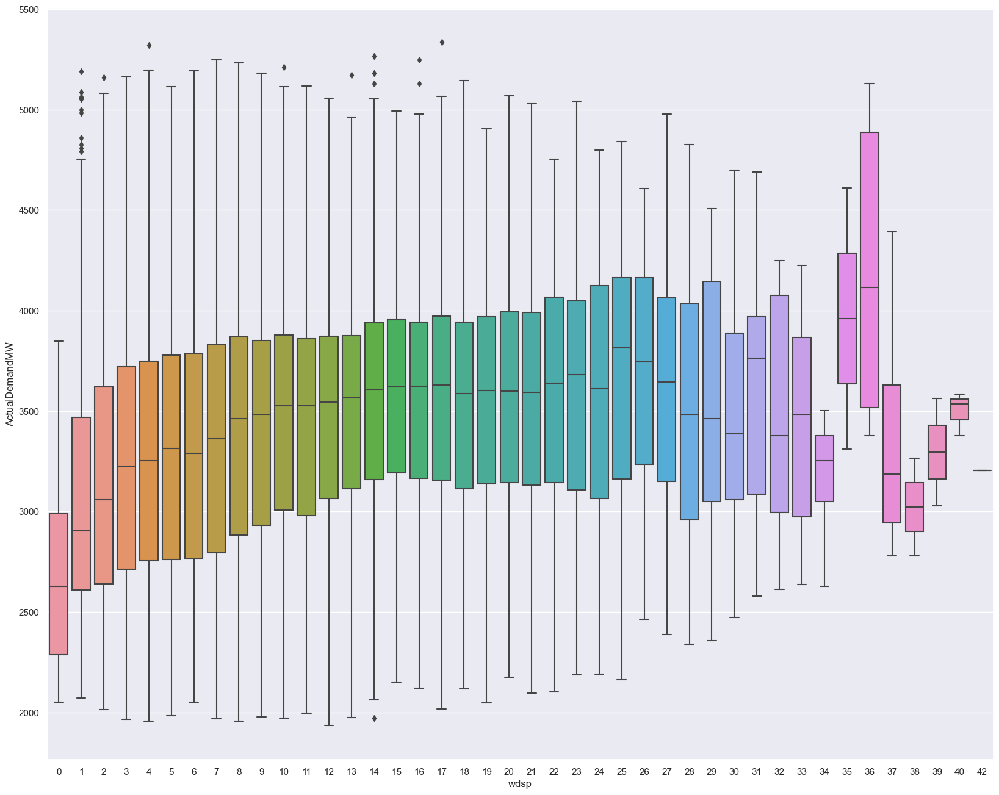

In [26]:
sns.boxplot(x="wdsp", y="ActualDemandMW", data=dataset)

-----------Checking rain by ExcessWind -------------


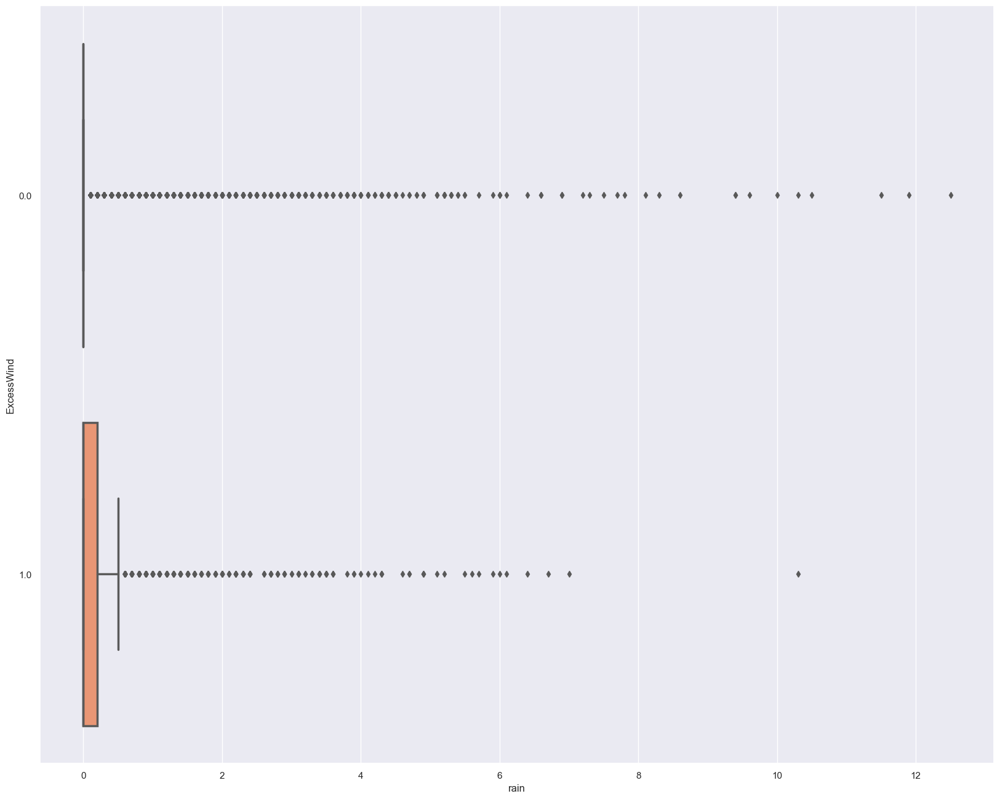

In [27]:
print('-----------Checking rain by ExcessWind -------------')
#using seaborn to Check wind speed by Month of each Year
sns.set_theme(style="whitegrid")

ExcessWind = dataset.groupby(['ExcessWind']).groups.keys()
rain = dataset['rain']

sns.set(rc={'figure.figsize':(20.0,16.00)})
ax = sns.boxplot(x=rain, y=dataset['ExcessWind'], data=dataset, linewidth=2.5, orient="h", palette="Set2")


In [28]:
dataset.corr()['RatioWindDemand'].sort_values()[0:50]

msl_MAL          -0.443317
msl_BEL          -0.438147
msl              -0.373588
msl_DUB          -0.372879
msl_COR          -0.338138
vis_COR          -0.268763
vis              -0.213052
temp_COR         -0.187123
sun_COR          -0.168616
temp_BEL         -0.164855
wetb_MAL         -0.159979
sun              -0.159613
temp_MAL         -0.156654
vappr_MAL        -0.155750
dewpt_MAL        -0.155636
wetb_BEL         -0.151739
sun_DUB          -0.149637
vis_DUB          -0.148312
clht_COR         -0.146761
temp             -0.143621
vappr_DUB        -0.142003
clht             -0.139588
dewpt_BEL        -0.137088
vappr_BEL        -0.136593
dewpt_DUB        -0.132869
wetb_DUB         -0.124863
wetb_COR         -0.123068
vappr            -0.121138
temp_DUB         -0.119829
dewpt            -0.112482
vappr_COR        -0.107361
wetb             -0.103911
dewpt_COR        -0.100098
clht_DUB         -0.099653
rhum_MAL         -0.039134
ActualDemandMW   -0.037469
rhum_DUB         -0.028032
w

In [29]:
dataset.corr()['RatioWindDemand'].sort_values()[50:69]

rhum_COR              0.161806
rain_COR              0.164290
rain_MAL              0.168758
ww_DUB                0.208013
rain_BEL              0.217326
w_DUB                 0.248258
ww                    0.253411
ww_COR                0.258906
w_COR                 0.320831
w                     0.327368
ActualGenerationMW    0.330502
ExcessWind            0.540835
wdsp_DUB              0.573902
wdsp_MAL              0.624338
wdsp_BEL              0.666105
wdsp_COR              0.703609
wdsp                  0.732605
ActualWindMW          0.950723
RatioWindDemand       1.000000
Name: RatioWindDemand, dtype: float64

In [30]:
dataset.sort_values(['RatioWindDemand'], ascending=False, axis=0, inplace=True)

# get the top 10 entries
dataset_top10 = dataset.head(10)

# transpose the dataframe
#dataset_top10 = dataset_top10[years].transpose()

dataset_top10

,Year,Month,Hour,rain_BEL,temp_BEL,wetb_BEL,dewpt_BEL,vappr_BEL,rhum_BEL,msl_BEL,...,vappr_MAL,rhum_MAL,msl_MAL,wdsp_MAL,wddir_MAL,ActualDemandMW,ActualWindMW,ActualGenerationMW,RatioWindDemand,ExcessWind
date,,,,,,,,,,,,,,,,,,,,,
2020-05-05 03:00:00,2020,May,3:00,0.0,7.5,6.2,4.5,8.4,81,1019.0,...,8.7,80,1022.7,14,110,2167.50,2076.00,2990.75,0.957785,1.0
2020-05-05 04:00:00,2020,May,4:00,0.0,8.1,6.9,5.5,9.0,83,1019.2,...,8.8,83,1023.1,15,110,2143.00,2046.00,2980.50,0.954736,1.0
2020-05-05 05:00:00,2020,May,5:00,0.0,7.9,6.8,5.5,9.0,84,1018.9,...,8.7,84,1023.0,15,110,2171.25,2068.00,3007.25,0.952447,1.0
2020-05-05 02:00:00,2020,May,2:00,0.0,8.3,6.6,4.4,8.4,76,1018.9,...,8.2,73,1023.0,16,130,2208.50,2097.25,3016.75,0.949626,1.0
2022-02-06 01:00:00,2022,Feb,1:00,0.1,8.4,6.5,4.2,8.2,74,1002.7,...,9.4,98,997.9,26,260,3174.50,2977.75,3837.50,0.938022,1.0
2022-02-06 00:00:00,2022,Feb,0:00,0.1,7.7,6.7,5.4,9.0,85,1002.9,...,9.1,96,998.4,25,260,3361.00,3129.50,3930.50,0.931122,1.0
2021-02-11 03:00:00,2021,Feb,3:00,0.0,-0.1,-1.7,-5.4,4.1,67,1019.0,...,4.6,73,1024.6,17,120,3235.50,3011.25,4012.00,0.930691,1.0
2019-09-28 02:00:00,2019,Sep,2:00,0.2,13.9,13.0,12.2,14.3,89,999.9,...,12.2,94,997.5,7,230,2434.00,2264.50,3382.50,0.930362,1.0
2020-12-29 02:00:00,2020,Dec,2:00,0.0,5.0,4.0,2.3,7.2,82,995.2,...,7.5,87,988.9,19,360,2782.25,2585.00,3740.75,0.929104,1.0


In [31]:
dfwindstation = dataset_top10[['wdsp','wdsp_DUB','wdsp_MAL','wdsp_BEL','wdsp_COR']]

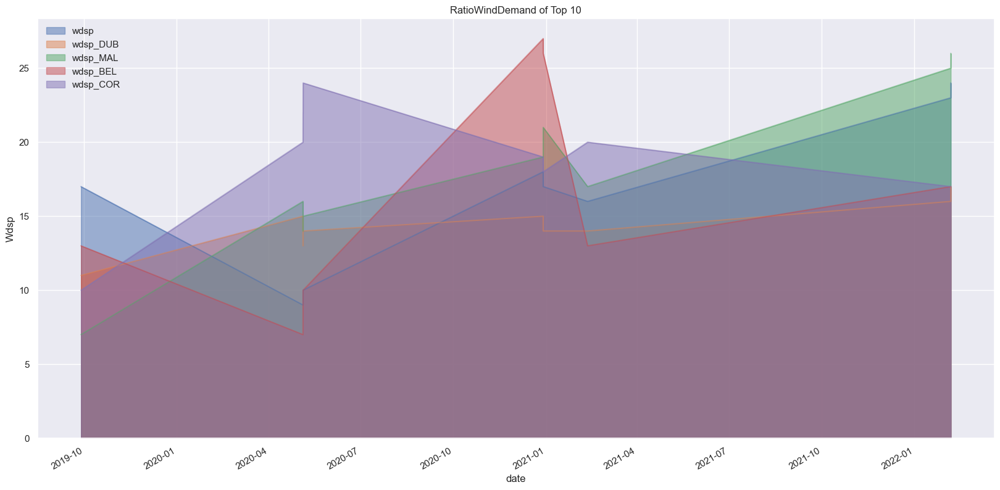

In [32]:
# artist layer
dfwindstation.plot(kind='area',
        stacked=False,
        figsize=(20, 10))  # pass a tuple (x, y) size

plt.title('RatioWindDemand of Top 10')
plt.ylabel('Wdsp')
plt.xlabel('date')

plt.show()

Text(0.5, 0, 'date')

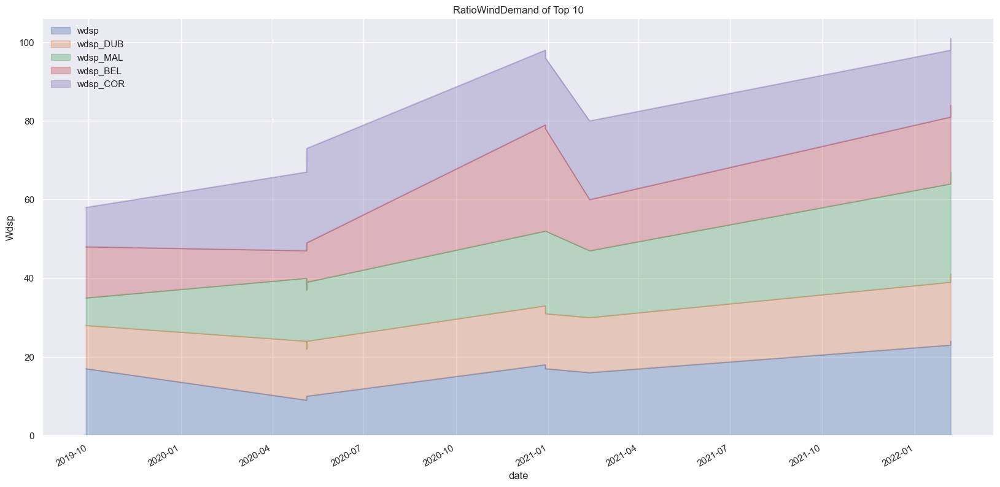

In [33]:
#Scripting layer
ax = dfwindstation.plot(kind='area', alpha=0.35, figsize=(20, 10))

ax.set_title('RatioWindDemand of Top 10')
ax.set_ylabel('Wdsp')
ax.set_xlabel('date')

In [34]:
# Histograms 
# np.histogram returns 2 values
count, bin_edges = np.histogram(dataset['RatioWindDemand'])

print(count) # frequency count
print(bin_edges) # bin ranges, default = 10 bins

[9221 7740 6255 4997 4585 4168 4196 3425 1265  180]
[-0.01176078  0.08519385  0.18214847  0.2791031   0.37605772  0.47301235
  0.56996697  0.66692159  0.76387622  0.86083084  0.95778547]


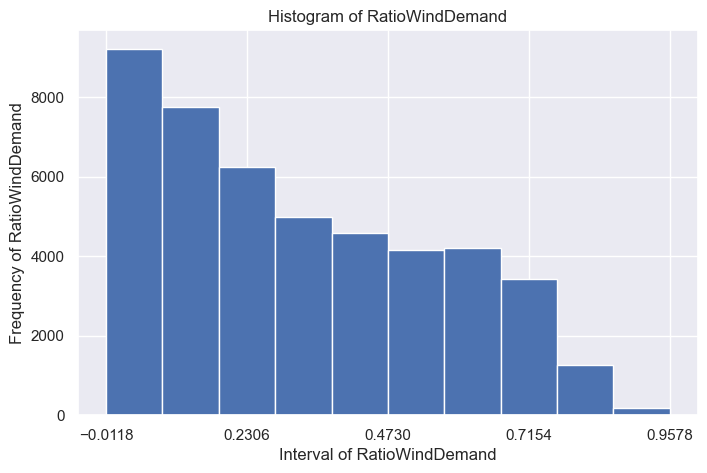

In [35]:
count, bin_edges = np.histogram(dataset['RatioWindDemand'], 4)
dataset['RatioWindDemand'].plot(kind='hist', figsize=(8, 5), xticks=bin_edges)

# add a title to the histogram
plt.title('Histogram of RatioWindDemand')
# add y-label
plt.ylabel('Frequency of RatioWindDemand')
# add x-label
plt.xlabel('Interval of RatioWindDemand')

plt.show()

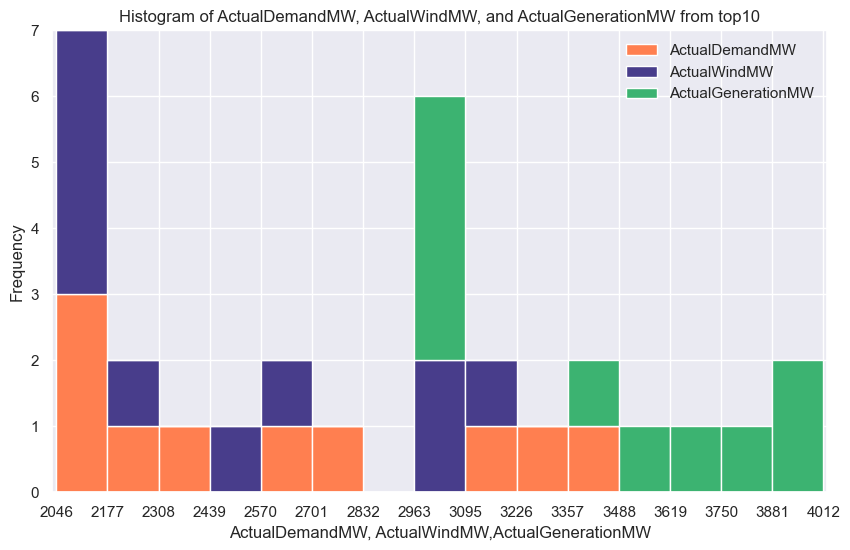

In [36]:
df_t = dataset_top10[['ActualDemandMW', 'ActualWindMW', 'ActualGenerationMW']]
count, bin_edges = np.histogram(df_t, 15)
xmin = bin_edges[0] - 10  
xmax = bin_edges[-1] + 10  

# stacked Histogram
df_t.plot(kind='hist',
          figsize=(10, 6), 
          bins=15,
          xticks=bin_edges,
          color=['coral', 'darkslateblue', 'mediumseagreen'],
          stacked=True,
          xlim=(xmin, xmax)
         )

plt.title('Histogram of ActualDemandMW, ActualWindMW, and ActualGenerationMW from top10')
plt.ylabel('Frequency')
plt.xlabel('ActualDemandMW, ActualWindMW,ActualGenerationMW')

plt.show()

-----------Checking the a pairwise relationships between these three attributes -------------


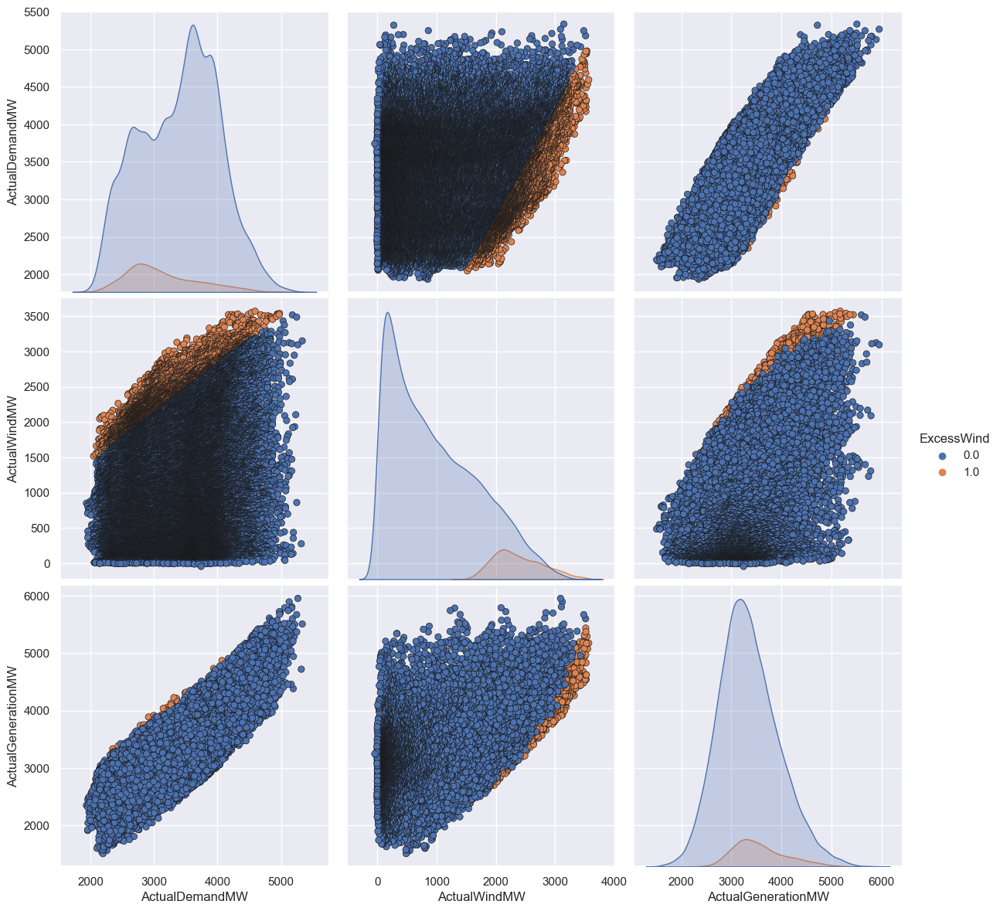

In [37]:
print('-----------Checking the a pairwise relationships between these three attributes -------------')
actualMW = dataset[['ActualDemandMW','ActualWindMW','ActualGenerationMW','ExcessWind']]
sns.pairplot(actualMW, hue = 'ExcessWind', diag_kind = 'kde',
             plot_kws = {'edgecolor': 'k'}, size = 4)

-----------Checking the a pairwise relationships between these three attributes -------------


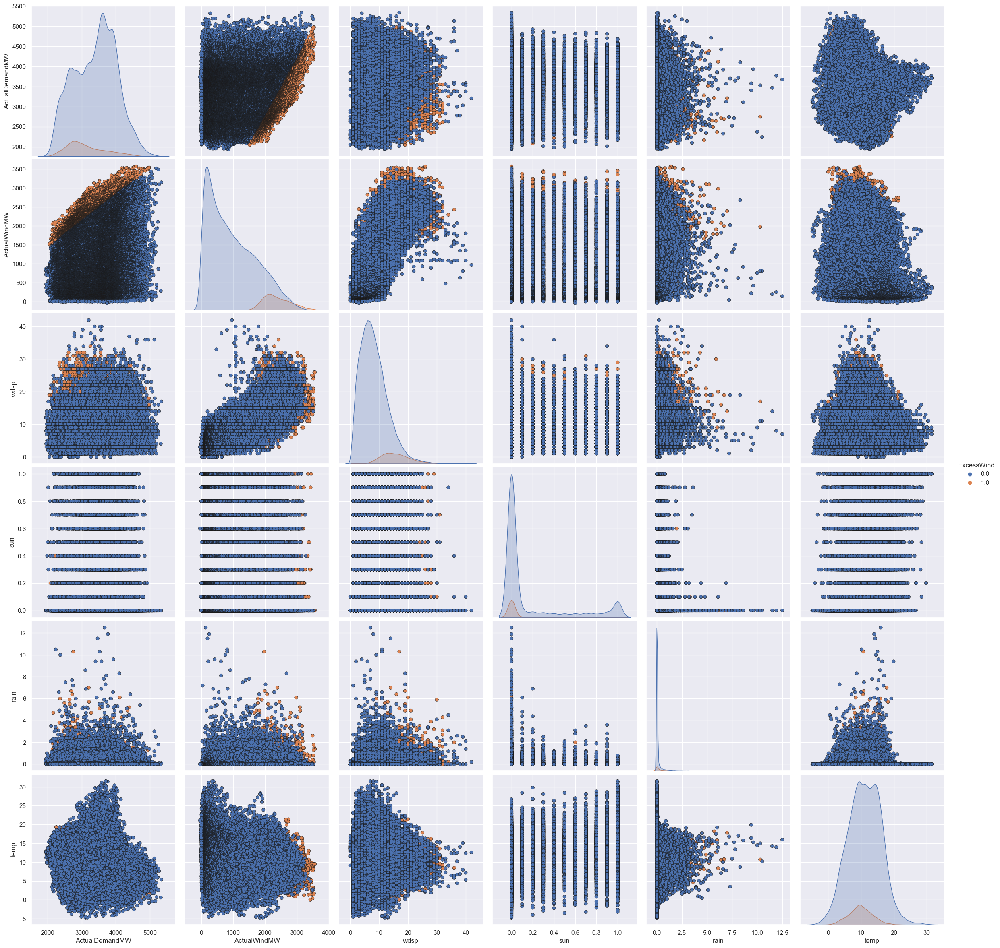

In [38]:
print('-----------Checking the a pairwise relationships between these three attributes -------------')
actualweather = dataset[['ActualDemandMW','ActualWindMW','wdsp','sun','rain','temp','ExcessWind']]
sns.pairplot(actualweather, hue = 'ExcessWind', diag_kind = 'kde',
             plot_kws = {'edgecolor': 'k'}, size = 4)

In [37]:
dataset.corr()['ActualDemandMW'].sort_values()[0:50]

rhum_DUB          -0.263524
rhum              -0.235730
rhum_COR          -0.220606
rhum_BEL          -0.202280
dewpt_MAL         -0.198673
dewpt             -0.194686
dewpt_COR         -0.194233
dewpt_BEL         -0.193458
vappr_MAL         -0.189883
vappr             -0.186229
vappr_BEL         -0.185321
vappr_COR         -0.184925
wetb_MAL          -0.177486
dewpt_DUB         -0.176647
vappr_DUB         -0.167131
rhum_MAL          -0.160551
wetb_BEL          -0.152810
temp_MAL          -0.147426
wetb_COR          -0.124901
ExcessWind        -0.112865
wetb              -0.110071
wetb_DUB          -0.104345
temp_BEL          -0.103223
temp_COR          -0.079409
clht_DUB          -0.073628
msl_MAL           -0.067633
msl_BEL           -0.063233
temp              -0.061651
msl_DUB           -0.058096
msl               -0.055501
clht_COR          -0.055382
msl_COR           -0.053399
temp_DUB          -0.041477
RatioWindDemand   -0.037469
clht              -0.033949
wddir_COR         -0

In [38]:
dataset.corr()['ActualDemandMW'].sort_values()[50:69]

vis_DUB               0.054922
w_COR                 0.066471
w                     0.067675
clamt_DUB             0.073890
w_DUB                 0.075940
vis_COR               0.132704
vis                   0.136246
wdsp_BEL              0.148334
wdsp_MAL              0.157930
wdsp                  0.182288
sun_DUB               0.184896
wdsp_COR              0.190734
Year                  0.190975
sun_COR               0.193486
wdsp_DUB              0.195001
sun                   0.202989
ActualWindMW          0.219203
ActualGenerationMW    0.790940
ActualDemandMW        1.000000
Name: ActualDemandMW, dtype: float64

In [23]:
import plotly.express as px

fig = px.scatter(dataset, x='Year', y='ActualDemandMW', color='Month')
fig.show()

In [42]:
import plotly.express as px

fig = px.scatter(dataset, x='Year', y='RatioWindDemand', color='Month')
fig.show()

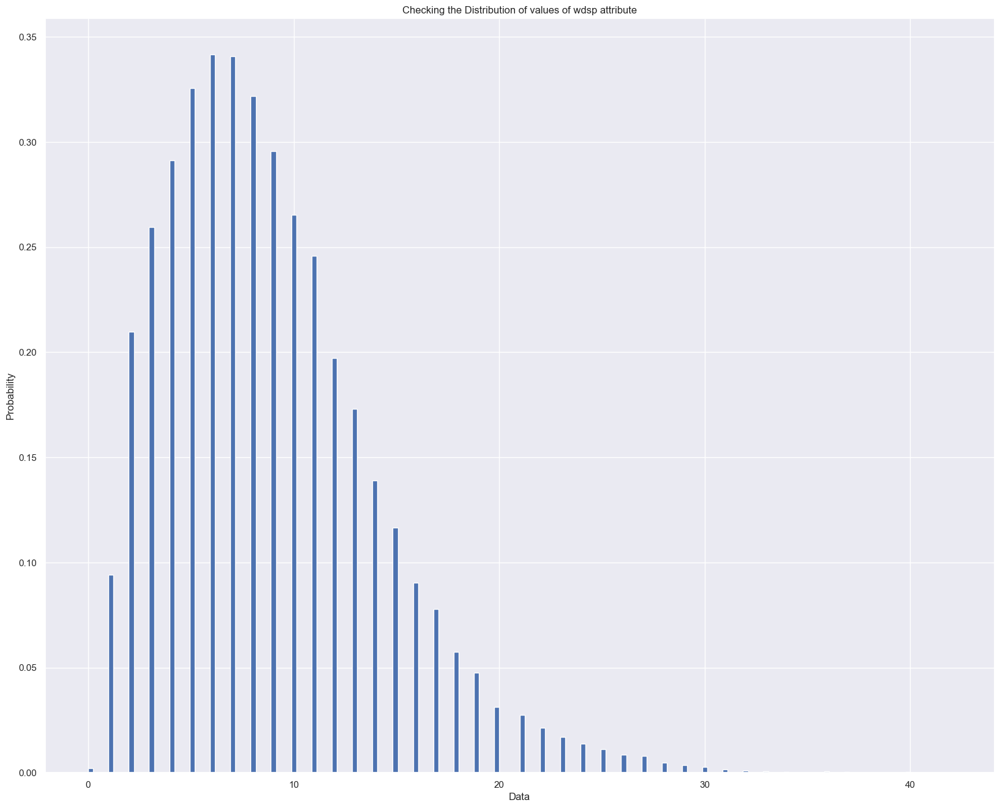

In [43]:
import scipy.stats as st
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

plt.hist(dataset['wdsp'], density=True, bins=170, label="Data")
mn, mx = plt.xlim()
plt.xlim(mn, mx)

plt.ylabel('Probability')
plt.xlabel('Data')
plt.title("Checking the Distribution of values of wdsp attribute");

-----------Checking the Distribution of values of ActualGenerationMW attribute -------------


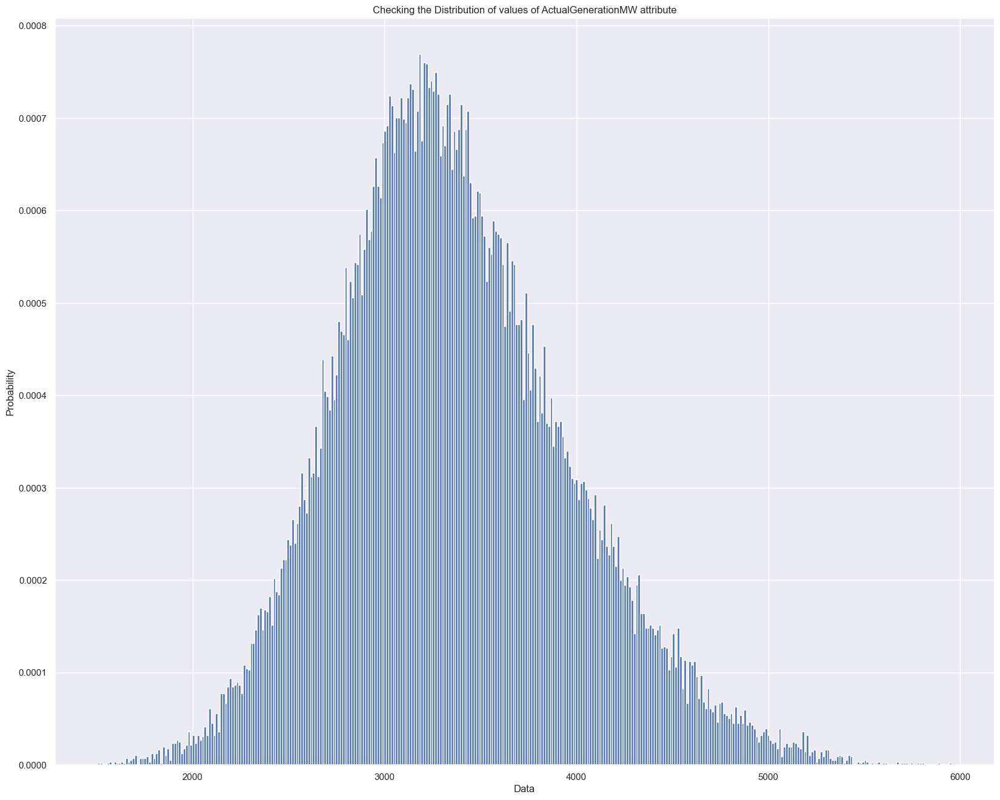

In [44]:
print('-----------Checking the Distribution of values of ActualGenerationMW attribute -------------')

# I have experimented a lot with the bins here
plt.hist(dataset['ActualGenerationMW'], density=True, bins=370, label="Data")
mn, mx = plt.xlim()
plt.xlim(mn, mx)

plt.ylabel('Probability')
plt.xlabel('Data')
plt.title("Checking the Distribution of values of ActualGenerationMW attribute");

-----------Creating the matrix of histograms/distributions of all the attributes -------------


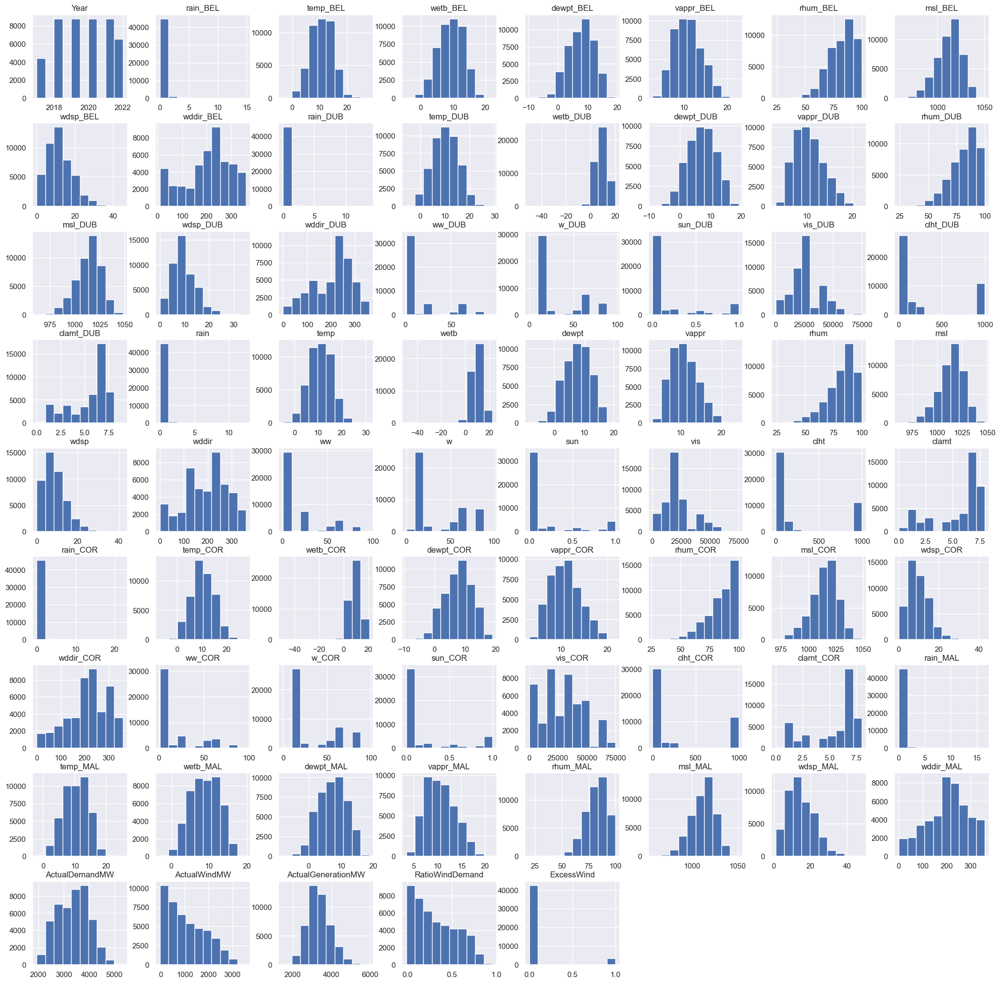

In [45]:
print('-----------Creating the matrix of histograms/distributions of all the attributes -------------')

fig = plt.figure(figsize = (25,25))
ax = fig.gca()

dataset.hist(ax=ax)
plt.show()

In [49]:
pearson_coef, p_value = st.pearsonr(dataset['ActualWindMW'], dataset['wdsp'])
print("The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P =", p_value)  

The Pearson Correlation Coefficient is 0.7651098726574994  with a P-value of P = 0.0


### Conclusion:
Since the p-value is 0.0, the correlation between 'ActualWindMW' and 'wdsp' is statistically significant, the linear relationship is quite strong (~0.77).

In [50]:
pearson_coef, p_value = st.pearsonr(dataset['ActualWindMW'], dataset['temp'])
print("The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P =", p_value)  

The Pearson Correlation Coefficient is -0.15815821600900543  with a P-value of P = 1.4738300856766653e-255


In [51]:
pearson_coef, p_value = st.pearsonr(dataset['ActualWindMW'], dataset['rain'])
print("The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P =", p_value)  

The Pearson Correlation Coefficient is 0.1510020458270494  with a P-value of P = 6.978718267841796e-233


In [52]:
pearson_coef, p_value = st.pearsonr(dataset['ActualWindMW'], dataset['wdsp_BEL'])
print("The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P =", p_value)

The Pearson Correlation Coefficient is 0.686978362090843  with a P-value of P = 0.0


In [53]:
pearson_coef, p_value = st.pearsonr(dataset['ActualWindMW'], dataset['wdsp_COR'])
print("The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P =", p_value)

The Pearson Correlation Coefficient is 0.7428750334057233  with a P-value of P = 0.0


In [54]:
pearson_coef, p_value = st.pearsonr(dataset['ActualWindMW'], dataset['wdsp_DUB'])
print("The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P =", p_value)

The Pearson Correlation Coefficient is 0.6122770105799172  with a P-value of P = 0.0


In [55]:
pearson_coef, p_value = st.pearsonr(dataset['ActualWindMW'], dataset['wdsp_MAL'])
print("The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P =", p_value)

The Pearson Correlation Coefficient is 0.6476122776629244  with a P-value of P = 0.0
